In [16]:
from constants import *
from my_functions import *
from neighbour_functions import *
from states_functions import *
from diffusion import *

#### *This is an area for testing different functions and has easy access for loading the state or the points for visualizations*

##### ***What are in the different segments***
 1. An area for plotting the state of the system and seeing if the diffusion function works
 2. An area for making a diffusion update system
 3. An area for checking how to make colormap animations


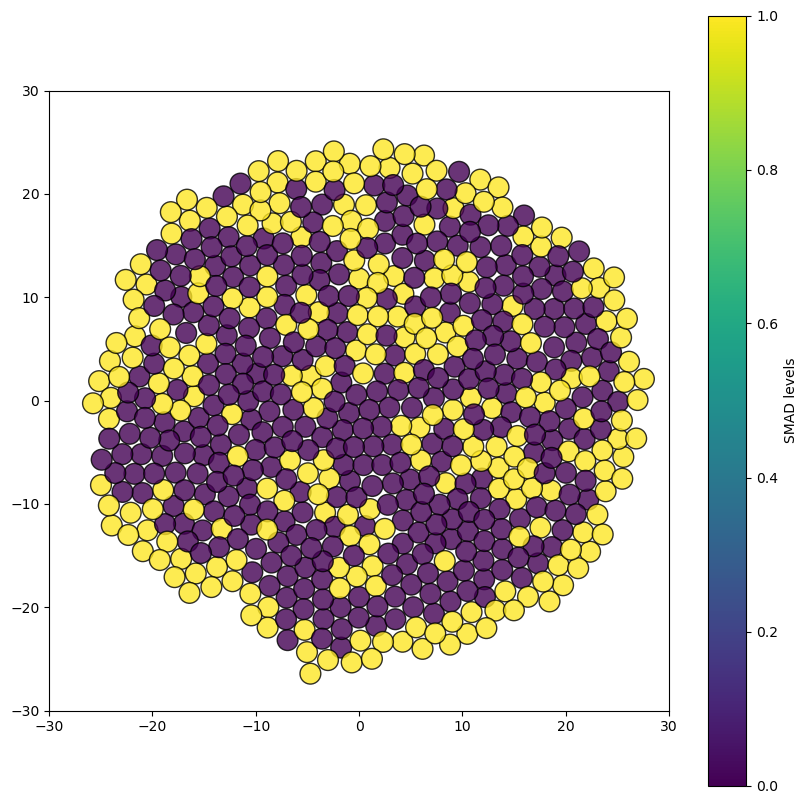

In [35]:
### Testing Area : Diffusion ###
# We load the state of the system
SMAD, NOGGIN = load_protein_steady_state("SMAD_NOGGIN_simulation.txt")
points = load_points("625cells.txt")
vor = Voronoi(points)
fig, axis = plt.subplots(figsize=(10, 10))
    

### Actually Plotting ###
screen_size = (-30, 30)
axis.set_xlim(screen_size)
axis.set_ylim(screen_size);
axis.set_aspect('equal')

# Initializing the colormap
colormap = plt.cm.viridis  # Choose a colormap, e.g., 'viridis'
norm = plt.Normalize(vmin=0, vmax=1)  # Normalize SMAD levels
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=colormap), ax=axis, orientation='vertical', label='SMAD levels')

# Simulates the change in  one operation
SMAD = diffusion_step(SMAD, vor, 0, select_noSMAD_cells=False)

for i, point in enumerate(points):
    
    # Now using the SMAD levels we need to generate a color intensity for the circle
    circle_color = colormap(norm(SMAD[i]))  # Map SMAD levels to colors using the colormap
    
    # Plot the circle
    circle = plt.Circle((point[0], point[1]), r_cell, facecolor=circle_color, edgecolor="black", alpha=0.8)
    axis.add_patch(circle)

### Diffusion animation

In [28]:
def diffuse_update(i, SMAD, vor, n_steps, fig, axis, colormap, norm):
    
    
    # Clear the axis
    axis.clear()
    
    # Plot the cells according to the new data
    for j, point in enumerate(points):
        # Now using the SMAD levels we need to generate a color intensity for the circle
        circle_color = colormap(norm(SMAD[j]))  # Map SMAD levels to colors using the colormap
        
        # Plot the circle
        circle = plt.Circle((point[0], point[1]), r_cell, facecolor=circle_color, edgecolor="black", alpha=0.8)
        axis.add_patch(circle)
    
    
    
    # We generate the new data for the next diffusion step
    SMAD = diffusion_step(SMAD, vor, n_steps, select_noSMAD_cells=False)
    
    
    # Set the axis limits
    axis.set_xlim(screen_size)
    axis.set_ylim(screen_size);
    axis.set_aspect('equal')
    
        
    return None
        
    
# We initialize the figure for animating:
fig, axis = plt.subplots(figsize=(8, 8))
axis.set_xlim(screen_size)
axis.set_ylim(screen_size);
axis.set_aspect('equal')

# Initialize the colormap
colormap = plt.cm.viridis 
norm = plt.Normalize(vmin=0, vmax=1)  # Normalize SMAD levels
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=colormap), ax=axis, orientation='vertical', label='SMAD levels')


# We animate the diffusion
animate(fig, diffuse_update, func_arguments=(SMAD, vor, 100, fig, axis, colormap, norm), n_frames=10, interval=100, save_anim=False, gif_name="diffusionTest.gif")

MovieWriter Pillow unavailable; using Pillow instead.


In [2]:
### Testing Area : Colormap plotting ###
def get_data(i, list_of_SMADS, list_of_NOGGINS):
    """Function for generating the data in the animation"""
    SMAD = list_of_SMADS[i]
    NOGGIN = list_of_NOGGINS[i]
    return SMAD, NOGGIN


def color_update(i, list_of_SMADS, list_of_NOGGINS, axis, vor, colormap, norm):
    """
    Update function is what is happening every frame. Imagine that you have to make a new plot every frame,
    but instead you clear the background and overlay something else.
    """
    # Step 1: Generate data
    SMAD, NOGGIN = get_data(i, list_of_SMADS, list_of_NOGGINS)
    
    # Step 2: Clear previous plot and plot the updated plot
    axis.clear()  # Alternatively ax.clear() Clears the entire thing, but collections offers selection

    for i, point in enumerate(points):
        # Generate code for the levels of SMAD and NOGGIN
        SMAD_levels, mean = get_level_of_protein(SMAD, i, vor)
        
        # Now using the SMAD levels we need to generate a color intensity for the circle
        circle_color = colormap(norm(SMAD_levels))  # Map SMAD levels to colors using the colormap
        
        # Plot the circle
        circle = plt.Circle((point[0], point[1]), r_cell, 
                            facecolor=circle_color, edgecolor="black", alpha=0.8)
        axis.add_patch(circle)

    # Step 5: Modification of axis layout should occur here
    axis.axis("equal")
    axis.set_xlim(screen_size)
    axis.set_ylim(screen_size)
    return None

### Regular plotting ###
# Load the system:
points = load_points("625cells.txt")
vor = Voronoi(points)

# Initialize the plot
fig, axis = plt.subplots(figsize=(7, 7))
axis.set_xlim(screen_size)
axis.set_ylim(screen_size)
axis.axis("equal")

# Initializing the colormap
colormap = plt.cm.viridis  # Choose a colormap, e.g., 'viridis'
norm = plt.Normalize(vmin=0, vmax=6)  # Normalize SMAD levels
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=colormap), ax=axis,
             orientation='vertical', label='SMAD levels')

# Simulate it
times, SMADs, NOGGINs = simulate_BMP(t_start, 10, dt, points, SMAD, NOGGIN)

# Animate it
animate(fig, color_update, (SMADs, NOGGINs, axis, vor, colormap, norm),
        len(SMADs), interval=100, save_anim=True, gif_name="Colormap_SMAD.gif")

MovieWriter Pillow unavailable; using Pillow instead.


In [5]:
a = np.arange(0, 100, 1)+10
print(a)

want = np.arange(1000, 1100, 1)
no_want = np.arange(0, 100, 1)


liste = np.where(a < 50)

print(want[liste])


print(liste, len(liste))

[ 10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27
  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45
  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63
  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81
  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99
 100 101 102 103 104 105 106 107 108 109]
[1000 1001 1002 1003 1004 1005 1006 1007 1008 1009 1010 1011 1012 1013
 1014 1015 1016 1017 1018 1019 1020 1021 1022 1023 1024 1025 1026 1027
 1028 1029 1030 1031 1032 1033 1034 1035 1036 1037 1038 1039]
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39], dtype=int64),) 1
